In [1]:
# Upload network data
from google.colab import files
files.upload()

Saving network_data_binary.csv to network_data_binary.csv


{'network_data_binary.csv': b'src_port,dst_port,protocol,flow_duration,flow_byts_s,flow_pkts_s,fwd_pkts_s,bwd_pkts_s,tot_fwd_pkts,tot_bwd_pkts,totlen_fwd_pkts,totlen_bwd_pkts,fwd_pkt_len_max,fwd_pkt_len_min,fwd_pkt_len_mean,fwd_pkt_len_std,bwd_pkt_len_max,bwd_pkt_len_min,bwd_pkt_len_mean,bwd_pkt_len_std,pkt_len_max,pkt_len_min,pkt_len_mean,pkt_len_std,pkt_len_var,fwd_header_len,bwd_header_len,fwd_seg_size_min,fwd_act_data_pkts,flow_iat_mean,flow_iat_max,flow_iat_min,flow_iat_std,fwd_iat_tot,fwd_iat_max,fwd_iat_min,fwd_iat_mean,fwd_iat_std,bwd_iat_tot,bwd_iat_max,bwd_iat_min,bwd_iat_mean,bwd_iat_std,fin_flag_cnt,down_up_ratio,pkt_size_avg,init_fwd_win_byts,init_bwd_win_byts,active_max,active_min,active_mean,active_std,idle_max,idle_min,idle_mean,idle_std,fwd_byts_b_avg,fwd_pkts_b_avg,bwd_byts_b_avg,bwd_pkts_b_avg,fwd_blk_rate_avg,bwd_blk_rate_avg,fwd_seg_size_avg,bwd_seg_size_avg,subflow_fwd_pkts,subflow_bwd_pkts,subflow_fwd_byts,subflow_bwd_byts,class\r\n57994,32414,17,120011448.0,13.1

In [2]:
import pandas as pd
import numpy as np
import tensorflow
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM

# Define a function to print accuracy graphs
def print_graphs(history): 
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs = range(1, len(acc) + 1)

  plt.plot(epochs, acc, 'bo', label='Training acc')
  plt.plot(epochs, val_acc, 'b', label='Validation acc')
  plt.title('Training and validation accuracy')
  plt.legend()

  plt.figure()

  plt.plot(epochs, loss, 'bo', label='Training loss')
  plt.plot(epochs, val_loss, 'b', label='Validation loss')
  plt.title('Training and validation loss')
  plt.legend()

  plt.show()

In [5]:
# Load dataset
network_df = pd.read_csv('network_data_binary.csv')
network_df.head()

,src_port,dst_port,protocol,flow_duration,flow_byts_s,flow_pkts_s,fwd_pkts_s,bwd_pkts_s,tot_fwd_pkts,tot_bwd_pkts,totlen_fwd_pkts,totlen_bwd_pkts,fwd_pkt_len_max,fwd_pkt_len_min,fwd_pkt_len_mean,fwd_pkt_len_std,bwd_pkt_len_max,bwd_pkt_len_min,bwd_pkt_len_mean,bwd_pkt_len_std,pkt_len_max,pkt_len_min,pkt_len_mean,pkt_len_std,pkt_len_var,fwd_header_len,bwd_header_len,fwd_seg_size_min,fwd_act_data_pkts,flow_iat_mean,flow_iat_max,flow_iat_min,flow_iat_std,fwd_iat_tot,fwd_iat_max,fwd_iat_min,fwd_iat_mean,fwd_iat_std,bwd_iat_tot,bwd_iat_max,bwd_iat_min,bwd_iat_mean,bwd_iat_std,fin_flag_cnt,down_up_ratio,pkt_size_avg,init_fwd_win_byts,init_bwd_win_byts,active_max,active_min,active_mean,active_std,idle_max,idle_min,idle_mean,idle_std,fwd_byts_b_avg,fwd_pkts_b_avg,bwd_byts_b_avg,bwd_pkts_b_avg,fwd_blk_rate_avg,bwd_blk_rate_avg,fwd_seg_size_avg,bwd_seg_size_avg,subflow_fwd_pkts,subflow_bwd_pkts,subflow_fwd_byts,subflow_bwd_byts,class
0,57994,32414,17,120011448.0,13.123748,0.208313,0.208313,0.0,25,0,1575,0,63.0,63.0,63.000000,0.000000,0.0,0.0,0.0,0.0,63,63,63.000000,0.000000,0.000000,200,0,8,25,5.000477e+06,5000903.0,4999876.0,2.813151e+02,120011448.0,5000903.0,4999876.0,5.000477e+06,2.813151e+02,0.0,0.0,0.0,0.0,0.0,0,0.0,63.000000,0,0,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.000000e+00,0.000000e+00,0.000000,0.000000,0.0,0.0,0.000000,0.0,63.000000,0.0,25,0,1575,0,0
1,57993,32412,17,115009762.0,13.146710,0.208678,0.208678,0.0,24,0,1512,0,63.0,63.0,63.000000,0.000000,0.0,0.0,0.0,0.0,63,63,63.000000,0.000000,0.000000,192,0,8,24,5.000424e+06,5000805.0,4999821.0,2.898415e+02,115009762.0,5000805.0,4999821.0,5.000424e+06,2.898415e+02,0.0,0.0,0.0,0.0,0.0,0,0.0,63.000000,0,0,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.000000e+00,0.000000e+00,0.000000,0.000000,0.0,0.0,0.000000,0.0,63.000000,0.0,24,0,1512,0,0
2,137,137,17,119287366.0,92.549617,1.005974,1.005974,0.0,120,0,11040,0,92.0,92.0,92.000000,0.000000,0.0,0.0,0.0,0.0,92,92,92.000000,0.000000,0.000000,960,0,8,120,1.002415e+06,16582947.0,0.0,2.690317e+06,119287366.0,16582947.0,0.0,1.002415e+06,2.690317e+06,0.0,0.0,0.0,0.0,0.0,0,0.0,92.000000,0,0,15865709.0,100453.0,1.642922e+06,4.072978e+06,15859468.0,16266.0,1.340248e+06,3.653405e+06,1200.000000,24.000000,0.0,0.0,103.142083,0.0,92.000000,0.0,120,0,11040,0,0
3,5353,5353,17,118571247.0,70.910952,0.868676,0.868676,0.0,103,0,8408,0,103.0,78.0,81.631068,4.910837,0.0,0.0,0.0,0.0,103,78,81.631068,4.910837,24.116316,824,0,8,103,1.162463e+06,17094487.0,0.0,2.997766e+06,118571247.0,17094487.0,0.0,1.162463e+06,2.997766e+06,0.0,0.0,0.0,0.0,0.0,0,0.0,81.631068,0,0,16167176.0,566.0,2.482269e+06,4.799008e+06,16070712.0,7219.0,1.615286e+06,3.911009e+06,460.571429,11.571429,0.0,0.0,104.933201,0.0,81.631068,0.0,103,0,8408,0,0
4,56185,5355,17,415295.0,361.189034,4.815854,4.815854,0.0,2,0,150,0,75.0,75.0,75.000000,0.000000,0.0,0.0,0.0,0.0,75,75,75.000000,0.000000,0.000000,16,0,8,2,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0,0.0,75.000000,0,0,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.000000e+00,0.000000e+00,0.000000,0.000000,0.0,0.0,0.000000,0.0,75.000000,0.0,2,0,150,0,0


In [10]:
X = network_df.loc[:, network_df.columns != 'class']
y = network_df[['class']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# Reshape dataset
X_train = X_train.values.reshape(-1, 1, 68)
X_test  = X_test.values.reshape(-1, 1, 68)
y_train = y_train.values.reshape(-1, 1, 1)
y_test = y_test.values.reshape(-1, 1, 1)

In [14]:
model_complex = tensorflow.keras.models.Sequential()
model_complex.add(tensorflow.keras.layers.LSTM(100, input_shape=(1, 68), activation='relu', return_sequences=True))
model_complex.add(Dropout(0.2))

model_complex.add(LSTM(100))
model_complex.add(Dropout(0.2))
model_complex.add(Dense(32, activation='relu'))
model_complex.add(Dropout(0.2))


model_complex.add(tensorflow.keras.layers.Dense(1, activation='sigmoid'))
model_complex.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [15]:
model_complex.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 1, 100)            67600     
_________________________________________________________________
dropout_3 (Dropout)          (None, 1, 100)            0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 100)               80400     
_________________________________________________________________
dropout_4 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 32)                3232      
_________________________________________________________________
dropout_5 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                

In [16]:
history = model_complex.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=50, batch_size=64)

Epoch 1/50
346/346 [==============================] - 7s 10ms/step - loss: 0.4882 - accuracy: 0.7569 - val_loss: 0.4283 - val_accuracy: 0.7818
Epoch 2/50
346/346 [==============================] - 3s 8ms/step - loss: 0.4796 - accuracy: 0.7727 - val_loss: 0.4018 - val_accuracy: 0.7971
Epoch 3/50
346/346 [==============================] - 3s 8ms/step - loss: 0.4581 - accuracy: 0.7776 - val_loss: 0.4185 - val_accuracy: 0.8037
Epoch 4/50
346/346 [==============================] - 3s 8ms/step - loss: 0.4407 - accuracy: 0.7900 - val_loss: 0.3828 - val_accuracy: 0.8247
Epoch 5/50
346/346 [==============================] - 3s 8ms/step - loss: 0.4320 - accuracy: 0.7927 - val_loss: 0.3855 - val_accuracy: 0.7995
Epoch 6/50
346/346 [==============================] - 3s 8ms/step - loss: 0.4294 - accuracy: 0.7926 - val_loss: 0.3753 - val_accuracy: 0.8200
Epoch 7/50
346/346 [==============================] - 3s 8ms/step - loss: 0.4297 - accuracy: 0.7926 - val_loss: 0.3809 - val_accuracy: 0.7913
Epoch

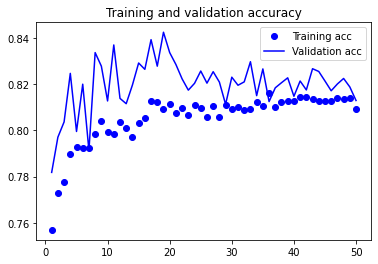

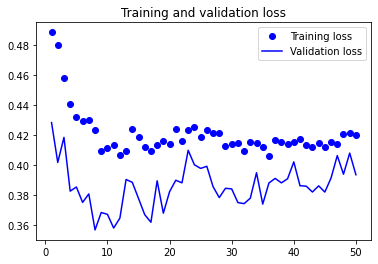

In [17]:
print_graphs(history)

In [18]:
model_simple = tensorflow.keras.models.Sequential()
model_simple.add(tensorflow.keras.layers.LSTM(100, input_shape=(1, 68), activation='relu', return_sequences=True))
model_simple.add(tensorflow.keras.layers.Dense(1, activation='sigmoid'))
model_simple.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model_simple.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, 1, 100)            67600     
_________________________________________________________________
dense_4 (Dense)              (None, 1, 1)              101       
Total params: 67,701
Trainable params: 67,701
Non-trainable params: 0
_________________________________________________________________


In [19]:
history = model_simple.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=50, batch_size=64)

Epoch 1/50
346/346 [==============================] - 3s 6ms/step - loss: 8655.5762 - accuracy: 0.7617 - val_loss: 5513.4175 - val_accuracy: 0.8153
Epoch 2/50
346/346 [==============================] - 2s 5ms/step - loss: 4623.3340 - accuracy: 0.8128 - val_loss: 4078.3088 - val_accuracy: 0.8198
Epoch 3/50
346/346 [==============================] - 2s 5ms/step - loss: 2438.9431 - accuracy: 0.8191 - val_loss: 1648.5568 - val_accuracy: 0.8257
Epoch 4/50
346/346 [==============================] - 2s 5ms/step - loss: 1618.5033 - accuracy: 0.8458 - val_loss: 1542.5145 - val_accuracy: 0.8266
Epoch 5/50
346/346 [==============================] - 2s 5ms/step - loss: 952.0231 - accuracy: 0.8466 - val_loss: 913.4659 - val_accuracy: 0.8471
Epoch 6/50
346/346 [==============================] - 2s 5ms/step - loss: 707.5197 - accuracy: 0.8494 - val_loss: 709.7000 - val_accuracy: 0.8451
Epoch 7/50
346/346 [==============================] - 2s 5ms/step - loss: 524.3962 - accuracy: 0.8551 - val_loss: 49

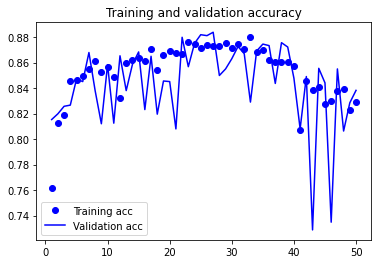

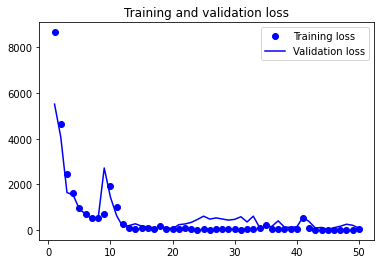

In [20]:
print_graphs(history)

In [22]:
model_simple.evaluate(X_test, y_test)

341/341 [==============================] - 1s 2ms/step - loss: 90.5861 - accuracy: 0.8382


[90.58607482910156, 0.8382177352905273]

In [23]:
model_complex.evaluate(X_test, y_test)

341/341 [==============================] - 1s 2ms/step - loss: 0.3937 - accuracy: 0.8130


[0.3936668634414673, 0.8129535913467407]